## Load data

In [ ]:
%matplotlib inline
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import scipy as sp

In [ ]:
def plot_imgs(img1, img2):
  fig, ax = plt.subplots(1, 2, figsize=(30, 40))
  #fig.tight_layout()
  for a in ax:
    a.set_axis_off()
  ax[0].imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
  ax[1].imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))



In [ ]:
im1 = cv2.imread("im2.jpg")
im2 = cv2.imread("im3.jpg")

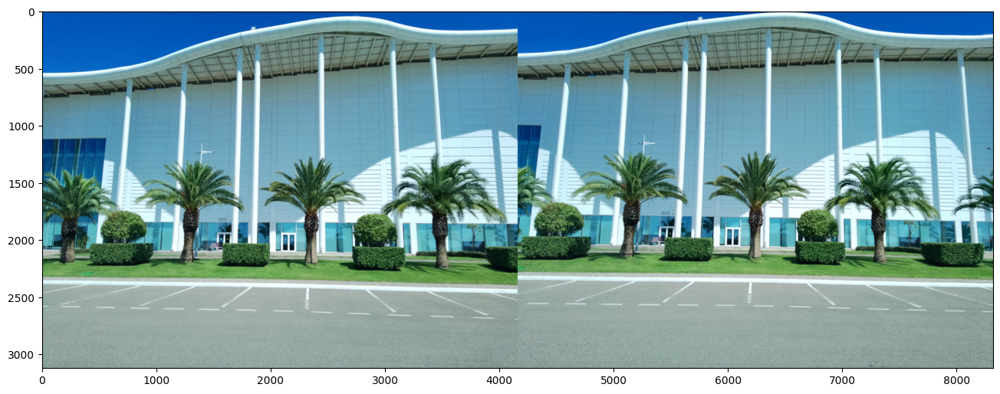

In [ ]:
plt.figure(figsize = (16,32))
plt.imshow(cv2.cvtColor(np.concatenate((im1, im2), axis = 1),cv2.COLOR_BGR2RGB))

## Utils

Alpha-Blend

In [ ]:
def alpha_blend(im1, im2, mask, winSize = None):
  im1 = np.moveaxis(im1, [2], [0]).astype(np.uint16)
  im2 = np.moveaxis(im2, [2], [0]).astype(np.uint16)
  if winSize is not None:
    mask = cv2.GaussianBlur(mask, (winSize, winSize), 0)
  res = (im1 * (255 - mask) + im2 * mask + 127)//255
  res = np.clip(res, 0, 255)
  return np.moveaxis(res, [0], [2]).astype(np.uint8)

Laplacian Pyramid Blending

In [ ]:
def make_gaussian_pyramid(im, nlevels=-1):
    """
    Builds pyramid levels = 1,2,3 ... with corresponding DFT spectrum
    Default behavor: nlevels = -1 - build full pyramid till im.shape <=2
    """
    pyr = [im.copy()]

    nlevels -= 1
    while nlevels != 0:
        tmp = cv2.pyrDown(pyr[-1])
        pyr += [tmp.copy()]

        if min(*tmp.shape) <= 2:
            break

        nlevels -= 1

    return pyr
def make_laplacian_pyramid(im, nlevels=-1):
    """
    Gaussian pyramid: g1, g2, ..., gn
    Laplacian pyramid: l1, l2, ... ln-1, gn
    NB1: The highest element in  laplacian ln == gn
    NB2: Pixel values of l can be negative, so we use np.int16
    """
    g = im.astype(np.int16) # current gaussian pyramid (initially coincide with the orginal image)
    lap_pyr = []
    nlevels -= 1
    while min(*g.shape) > 2 and nlevels!=0:
        g_next = cv2.pyrDown(g)
        g_next_up = cv2.pyrUp(g_next, dstsize=g.shape[::-1][1:])
        l = g - g_next_up # laplacian pyramid layer
        l_norm = ((l - l.min()) / (l.max() - l.min()) * 255).astype(np.uint8)
        lap_pyr += [l]
        g = g_next

        nlevels -= 1

    lap_pyr += [g] # the highest level of Laplacian pyramid is gaussian

    return lap_pyr
def pyramidal_merge_pair(im1, im2, mask, nlevels=-1):

    def weighted_sum(u1, u2, m):
        u = np.empty_like(u1)
        for i in range(3):
          u[:,:,i] = (u1[:,:,i] * (255 - m) + u2[:,:,i] * m) // 255
        return u

    pyrm = make_gaussian_pyramid(mask, nlevels) # gaussian pyramid of the mask
    pyrl = make_laplacian_pyramid(im1, nlevels) # laplacian pyramid of the first image
    pyr2 = make_laplacian_pyramid(im2, nlevels) # laplacian pyramid of the second image

    #mask = cv2.GaussianBlur(mask, (7, 7), 0)

    # Layer 0
    u1 = pyrl[-1].astype(np.int32)
    u2 = pyr2[-1].astype(np.int32)
    m = pyrm[-1]

    u = weighted_sum(u1, u2, m)
    u = np.clip(u, -16536, 16535).astype(np.int16)
    g = [np.clip(u, 0, 255).astype(np.uint8)]
    # Rest of the layers
    for lap1, lap2, m in zip(pyrl[-2::-1], pyr2[-2::-1], pyrm[-2::-1]):
        u = cv2.pyrUp(u, dstsize=m.shape[::-1])
        lap1 = lap1.astype(np.int32)
        lap2 = lap2.astype(np.int32)
        lap = weighted_sum(lap1, lap2, m)
        u += lap
        g.insert(0, np.clip(u, 0, 255).astype(np.uint8))

    u = np.clip(u, 0, 255).astype(np.uint8)
    return u, g

## Detect features and its descriptors (SIFT)

In [ ]:
sift = cv2.SIFT.create()

In [ ]:
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

In [ ]:
kp1, des1 = sift.detectAndCompute(im1_gray, None)
kp2, des2 = sift.detectAndCompute(im2_gray, None)

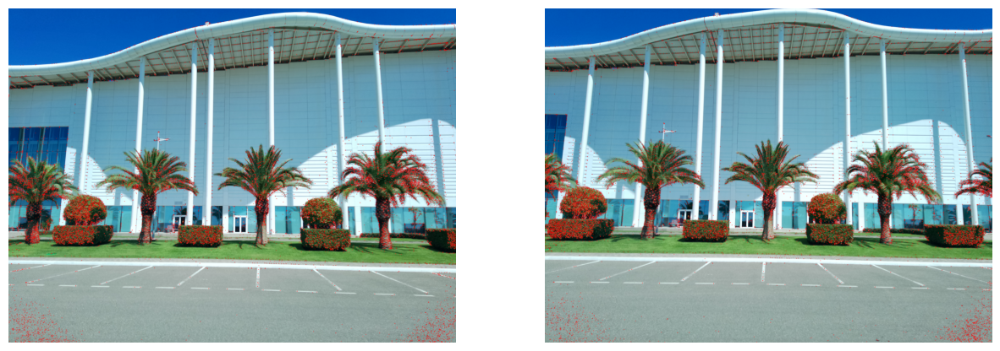

In [ ]:
kp_img1 = cv2.drawKeypoints(im1, kp1, None, color=(0,0,255), flags=0)
kp_img2 = cv2.drawKeypoints(im2, kp2, None, color=(0,0,255), flags=0)
plot_imgs(kp_img1, kp_img2)

## Feature matching using ratio test

In [ ]:
bf = cv2.BFMatcher() # brute force feature matcher
matches = bf.knnMatch(des1,des2,k=2) # find for each feature 2 closest according to euclidian distance

Ratio test is a ratio between euclidian distances from the source image point descriptor and two closest descriptors from target image point

In [ ]:
# Apply ratio test
good_matches = []
thershold = 0.75
for m,n in matches:
    if m.distance < thershold*n.distance:
        good_matches.append([m])

In [ ]:
matched_imgs = cv2.drawMatchesKnn(im1, kp1, im2, kp2, random.choices(good_matches, k=50),
                            outImg=None,
                            matchColor=(0, 0, 255),
                            singlePointColor=(0, 255, 255),
                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

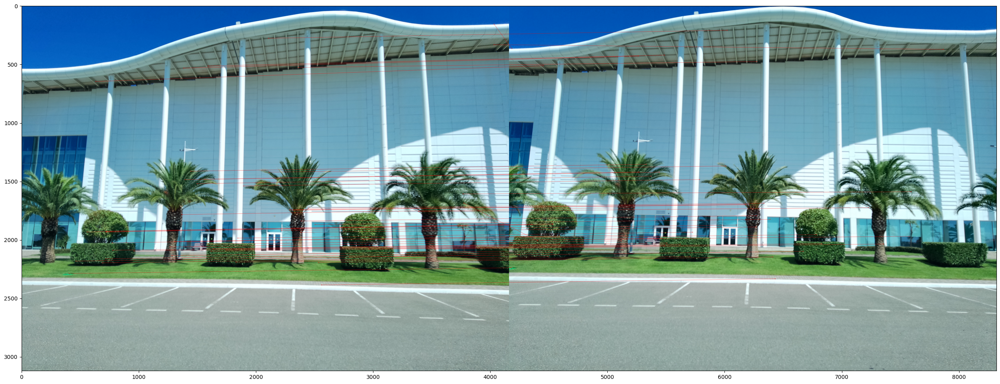

In [ ]:
plt.figure(figsize = (32,64))
plt.imshow(cv2.cvtColor(matched_imgs, cv2.COLOR_BGR2RGB))

## Fitting Homography to well matched points

In [ ]:
good_kp1_indx = []
good_kp2_indx = []
for m in good_matches:
  good_kp1_indx.append(m[0].queryIdx)
  good_kp2_indx.append(m[0].trainIdx)


In [ ]:
good_kp1 = []
good_kp2 = []
for i,j in zip(good_kp1_indx, good_kp2_indx):
  good_kp1.append(kp1[i])
  good_kp2.append(kp2[j])

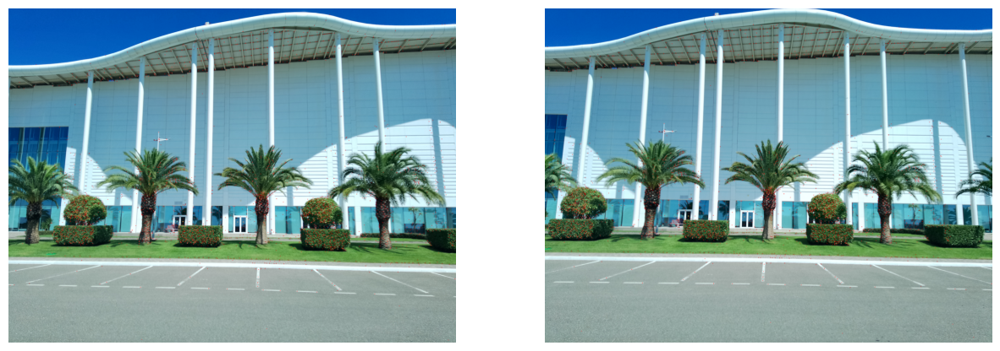

In [ ]:
kp_good_img1 = cv2.drawKeypoints(im1, good_kp1, None, color=(0,0,255), flags=0)
kp_good_img2 = cv2.drawKeypoints(im2, good_kp2, None, color=(0,0,255), flags=0)
plot_imgs(kp_good_img1, kp_good_img2)

In [ ]:
 H, status = cv2.findHomography(cv2.KeyPoint.convert(good_kp2), cv2.KeyPoint.convert(good_kp1), method = cv2.RANSAC) # im1_pts ~ H * im2_pts

## Warping im2 to the coordinate system of im1

In [ ]:
def get_bounding_box(im, H):
  """
  1. H_new: Corrects homography matrix by applying translation, so here is no negative values after wrapPerspective
  2. x,y : Estimates destination size image for applying wrapPerspective
  """
  corner_pts = np.array([[0,0],[im.shape[1] - 1, 0],[im.shape[1] - 1,im.shape[0] - 1], [0, im.shape[0] - 1]])
  corners_pts_trans = cv2.perspectiveTransform(corner_pts.reshape(-1,1,2).astype(np.float32), H)
  max_val = np.max(corners_pts_trans.squeeze(), axis = 0)
  min_val = np.min(corners_pts_trans.squeeze(), axis = 0)
  #x_sz, y_sz = np.ceil(max_val - np.where(min_val < 0., min_val, 0.))
  # tranlation homography matrix
  trans_vec = - np.where(min_val < 0., min_val, 0.)
  H_trans= np.eye(3)
  H_trans[:2,2] = trans_vec
  H_new = H_trans@H # we need additionaly transalte points wich  project to negative values, so we could see the whole wrap
  corners_pts_trans_new = cv2.perspectiveTransform(corner_pts.reshape(-1,1,2).astype(np.float32), H_new)
  print(corners_pts_trans_new)
  x_sz, y_sz = np.max(corners_pts_trans_new.squeeze(), axis = 0)
  return H_new, int(x_sz), int(y_sz)

In [ ]:
H1 , w, h = get_bounding_box(im2, H)

[[[3.7754144e+02 2.8485452e+02]]

 [[4.5273364e+03 1.3931954e-06]]

 [[4.6504175e+03 3.3473708e+03]]

 [[3.9238034e+02 3.2206501e+03]]]


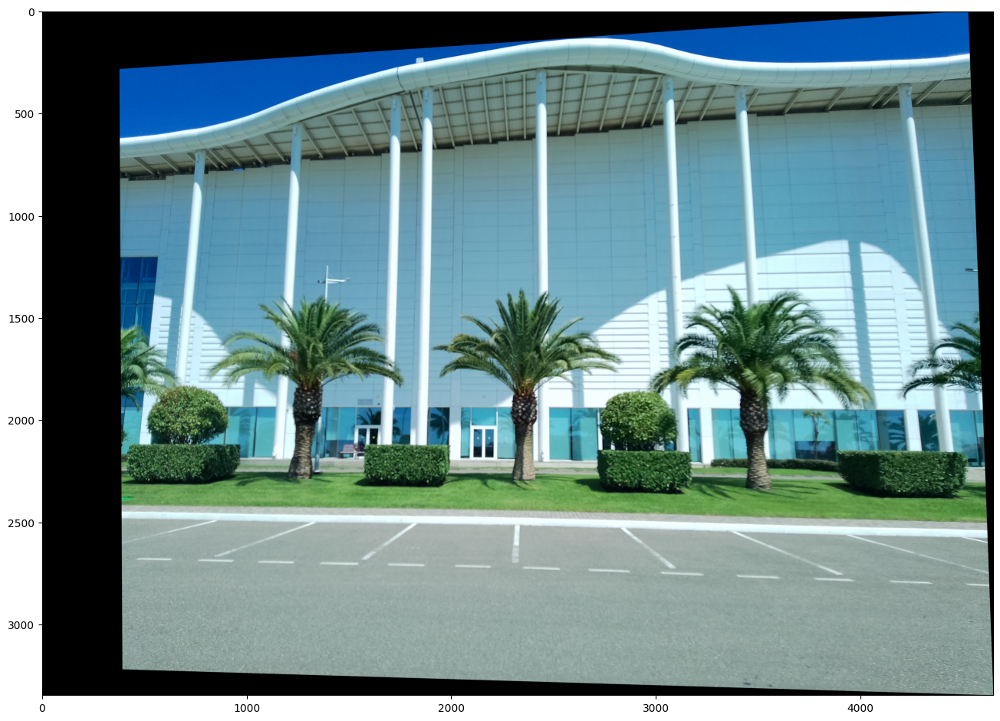

In [ ]:
im2_warped = cv2.warpPerspective(im2, H1, (w,h)) # im_out ~ H * im2
plt.figure(figsize = (16,32))
plt.imshow(cv2.cvtColor(im2_warped, cv2.COLOR_BGR2RGB))

# Stitching panorama

In [ ]:
imgs = []
for i in range(5):
  imgs.append(cv2.imread("im" + str(i+1) + ".jpg"))

In [ ]:
def get_homography(im1, im2):
  """
  Computes homography between 2 images im1 ~ H * im2
  """
  im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
  im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  sift = cv2.SIFT.create()
  kp1, des1 = sift.detectAndCompute(im1_gray, None)
  kp2, des2 = sift.detectAndCompute(im2_gray, None)
  bf = cv2.BFMatcher() # brute force feature matcher
  matches = bf.knnMatch(des1,des2,k=2) # find for each feature 2 closest according to euclidian distance
  # Apply ratio test
  good_matches = []
  thershold = 0.75
  for m,n in matches:
      if m.distance < thershold*n.distance:
          good_matches.append(m)
  N_pts = len(good_matches)
  good_kp1 = np.zeros((N_pts, 2))
  good_kp2 = np.zeros((N_pts, 2))
  for i in range(N_pts):
    good_kp1[i] = kp1[good_matches[i].queryIdx].pt
    good_kp2[i] = kp2[good_matches[i].trainIdx].pt
  H, status = cv2.findHomography(good_kp2, good_kp1, method = cv2.RANSAC) # im1_pts ~ H * im2_pts
  return H

In [ ]:
def pairwise_homographies(imgs : list):
  """
  Finds homographies to the center image, corner coordiantes for the wraped images
  and stores this information in Frame data structure
  """
  Hs = []
  for i in range(len(imgs) - 1):
    H = get_homography(imgs[i+1], imgs[i])
    Hs.append(H)
  return Hs

In [ ]:
class Frame:
  @staticmethod
  def get_corners(shape, H):
      """
      Corner coordinates (x,y) after applying homography
      """
      corner_pts = np.array([[0,0],[0, shape[0] - 1], [shape[1] - 1, 0], [shape[1] - 1,shape[0] - 1]])
      corners_pts_new = cv2.perspectiveTransform(corner_pts.reshape(-1,1,2).astype(np.float32), H).squeeze()
      corn_left_side = corners_pts_new[0:2]
      corn_right_side = corners_pts_new[2:]
      corn_top_side = corners_pts_new[[0,2], :]
      corn_bottom_side = corners_pts_new[[1,3], :]
      return np.min(corn_left_side[:,0]), np.max(corn_right_side[:,0]), np.min(corn_top_side[:,1]), np.max(corn_bottom_side[:,1])

  def __init__(self, im, H, x_shift = 0, y_shift = 0, xL_min = None, xR_max = None):
    self.im = im
    self.w = im.shape[1]
    self.h = im.shape[0]
    self.H = H
    if (xL_min is None) and (xR_max is None):
      self.xL_min, self.xR_max, _, _ = Frame.get_corners(im.shape, self.H)
    else:
      self.xL_min = xL_min
      self.xR_max = xR_max
    H_trans= np.eye(3)
    H_trans[0:2,2] = [x_shift, y_shift]
    self.H = H_trans@H # need additionaly transalte points wich  project to negative x,y values after wrapping the image
    self.xL_min += x_shift
    self.xR_max += x_shift

  def apply_homography(self, size):
      return cv2.warpPerspective(self.im, self.H, size)

  def imshow(self, transformed = True):
    plt.figure(figsize = (16,32))
    if transformed:
      plt.imshow(cv2.cvtColor(self.apply_homography((self.w, self.h)),cv2.COLOR_BGR2RGB))
    else:
      plt.imshow(cv2.cvtColor(self.im,cv2.COLOR_BGR2RGB))



In [ ]:
def get_panorama_homographies(Hs, center_img : int):
  H_panoram = [] # homographies wrapping all the images into center_img
  H = np.eye(3)
  for i in range(center_img-1, -1, -1):
    H = H @ Hs[i]
    H_panoram.insert(0, H)

  H_panoram.append(np.eye(3))

  H = np.eye(3)
  for i in range(center_img, len(imgs) - 1):
    H = H @ Hs[i]
    H_panoram.append(np.linalg.inv(H))
  return H_panoram

In [ ]:
def get_panorama_frames(imgs : list, H, x_shift, y_shift):
  frames = []
  for i in range(len(imgs)):
       frames.append(Frame(imgs[i], H[i], x_shift, y_shift))
  return frames

In [ ]:
def merge_frames(f_L, f_R, height, x_offset = 0.5, winSize = 11, pyrLapBlend = False):

  # the seam with adjustable position
  seam =  (1-x_offset)*f_R.xL_min + x_offset*f_R.xR_max

  # mask
  panorama_width = np.ceil(np.max(f_R.xR_max)).astype(np.int16)
  mask = np.zeros((height, panorama_width), dtype = np.uint8)
  mask[:, int(np.round(seam)):] = 255

  # convert images to the common plane
  im_L = f_L.apply_homography((panorama_width, height))
  im_R = f_R.apply_homography((panorama_width, height))

  # combine images uasing different type of blends
  if pyrLapBlend:
    panorama, _ = pyramidal_merge_pair(im_L, im_R, mask)
  else:
    panorama = alpha_blend(im_L, im_R, mask, winSize)

  f_new = Frame(panorama, np.eye(3), xL_min = f_L.xL_min, xR_max = f_R.xR_max)
  return f_new

In [ ]:
def stitch(frames : list, x_offsets : list, height, center_img : int, winSize = 115, lapPyrBlend = False):
  panorama = frames[0]
  for i in range(1, len(frames)):
    #seam_pos = False if i < center_img else True
    #x_offset = 0.5
    panorama = merge_frames(panorama, frames[i], height, x_offsets[i-1], winSize, lapPyrBlend)
  return panorama


In [ ]:
def get_panorama_size(shape, Hs):
  XminL, XmaxR, YminT1, YmaxB1 =  Frame.get_corners(shape, Hs[0])
  x_shift = - XminL  # x_shift to account for negative x values after homography wrap of the most left image
  _, _ , YminT2, YmaxB2 =  Frame.get_corners(shape, Hs[len(Hs)-1])
  ymin = np.minimum(YminT1, YminT2)
  ymax = np.maximum(YmaxB1, YmaxB2)

  height = np.ceil(ymax - ymin).astype(np.int16) # height of the panoram
  y_shift = - ymin # y_shift to account for negative y values after homography wrap of the most left/right image
  return height, x_shift, y_shift

In [ ]:
# Computing homographies between frames next to each other
hs = pairwise_homographies(imgs)

In [ ]:
def get_panoram(imshape, hs, center_plain_indx : np.int16, x_offsets : list, winSize = 115, lapPyrBlend = False):
  # Stitching frames
  Hs = get_panorama_homographies(hs, center_plain_indx)
  # Calculating resulting panorama shape
  h, xs, ys = get_panorama_size(imshape, Hs)
  # Create frames objects with infomation about xL__min and xR_max coordinates for seem estimation
  frames = get_panorama_frames(imgs, Hs, xs, ys)
  res = stitch(frames, x_offsets, h, 2, winSize=115, lapPyrBlend=lapPyrBlend)
  return res

Alpha blend (cannot deal with brightness changes among the photos)

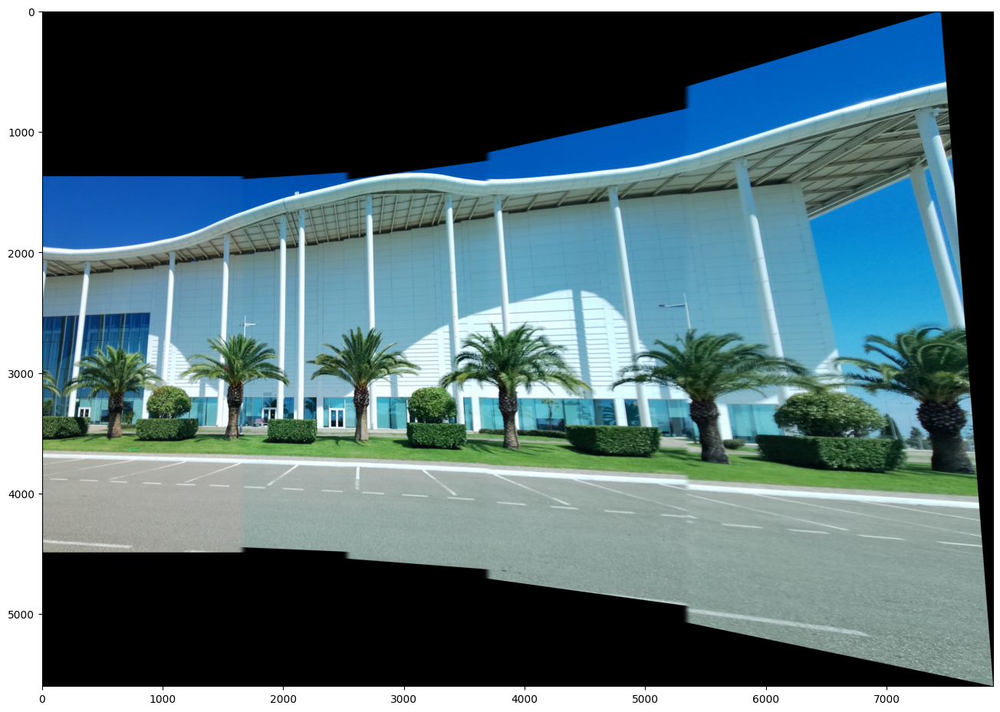

In [ ]:
# the left most frame as the center frame
pan1 = get_panoram(imgs[0].shape, hs, 0, [0.3, 0.4, 0.5, 0.6])
pan1.imshow(transformed=False)

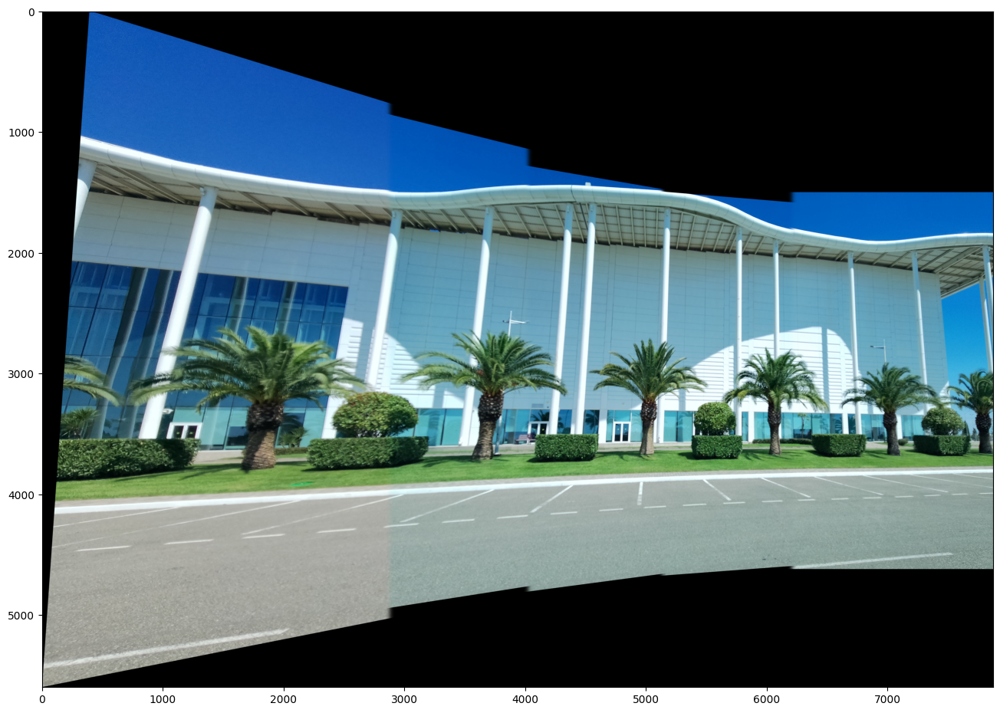

In [ ]:
# the right most frame as the center plane
pan2 = get_panoram(imgs[0].shape, hs, 4, [0.3, 0.4, 0.5, 0.6])
pan2.imshow(transformed=False)

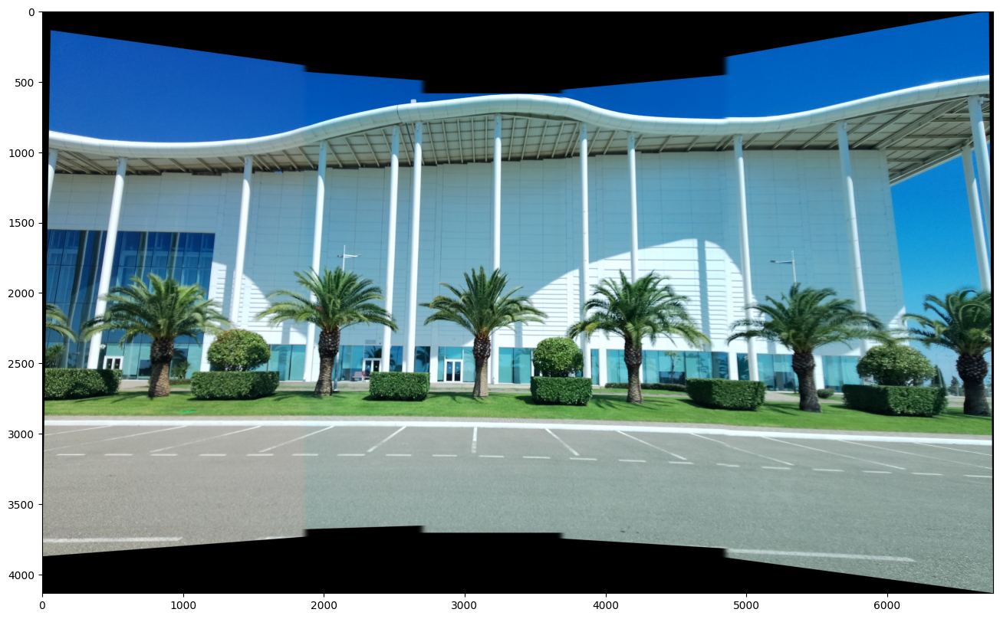

In [ ]:
# the center frame as the center plane
pan2 = get_panoram(imgs[0].shape, hs, 2, [0.3, 0.4, 0.5, 0.6])
pan2.imshow(transformed=False)

Laplacian blend

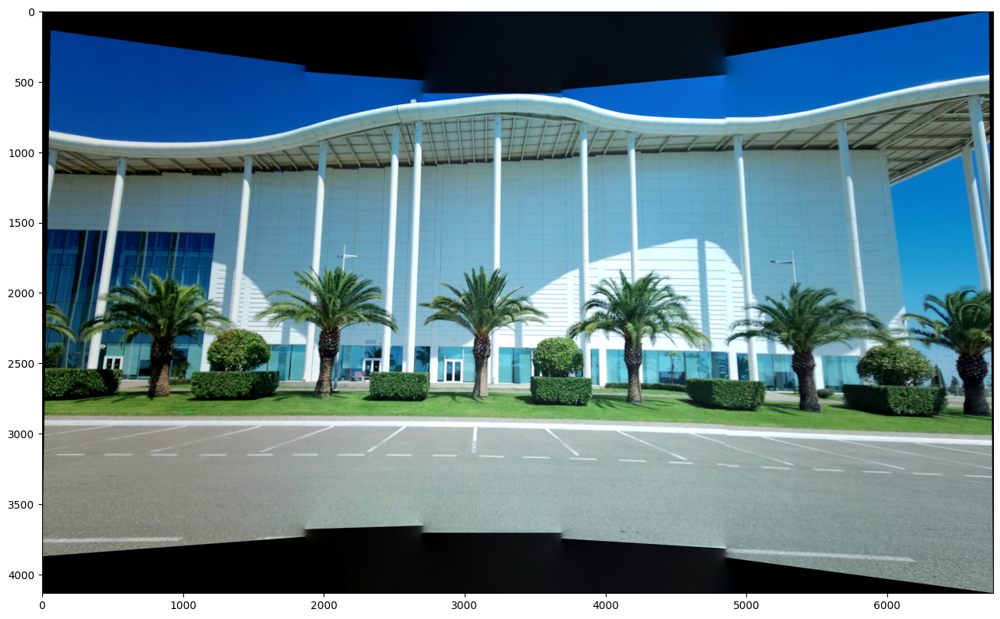

In [ ]:
# the center frame as the center plane
pan3 = get_panoram(imgs[0].shape, hs, 2, [0.3, 0.4, 0.5, 0.6], lapPyrBlend=True)
pan3.imshow(transformed=False)

## Projection on Cylinder

In [ ]:
def get_cyl_transform(imshape, delta, FOV = np.pi/3):
    ny, nx, _ = imshape

    # Estimate Camera Intrinsics
    cx = nx//2
    cy = ny//2
    fx = cx*1/np.tan(FOV)
    print(f"Estimation for focal length: {fx}")
    # Adjust cylinder radius
    R = fx + delta
    print(f"Cylinder radius: {R}")
    # Estimate the size of the transformed image
    s0 = R * np.arctan(cx / R)

    ns = np.round(s0 + R*np.arctan((nx-1-cx)/R)).astype(int)
    nh = ny

    # s - is a new x coordiante of the projected image
    s = np.arange(0, ns)


    x = cx + R * np.tan((s - s0) / R)

    theta = (s - s0) / R

    # h - is a new y coordinate of the projected image
    h0 = cy
    h = np.arange(0, nh)

    y = cy + (h[:, np.newaxis] - h0) / np.cos(theta)

    map = np.zeros((nh, ns, 2), np.float32)
    map[:, :, 0] = x
    map[:, :, 1] = y

    return map

Cylinder radius equal focal length

In [ ]:
map1 = get_cyl_transform(pan3.im.shape, 0., FOV = 60)
pan1_mapped = cv2.remap(pan3.im, map1, None, interpolation =  cv2.INTER_CUBIC)

Estimation for focal length: 10548.668580690033
Cylinder radius: 10548.668580690033


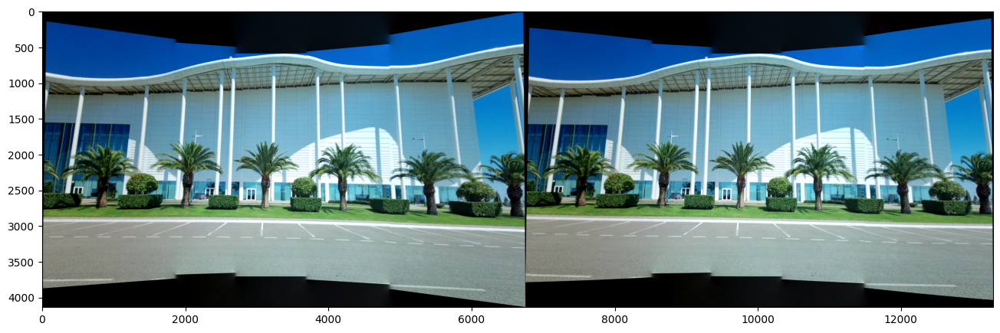

In [ ]:
plt.figure(figsize = (16,32))
plt.imshow(cv2.cvtColor(np.concatenate((pan3.im, pan1_mapped), axis = 1),cv2.COLOR_BGR2RGB))

Small Cylinder radius

In [ ]:
map1 = get_cyl_transform(pan3.im.shape, -8000., FOV = 60)
pan1_mapped = cv2.remap(pan3.im, map1, None, interpolation =  cv2.INTER_CUBIC)

Estimation for focal length: 10548.668580690033
Cylinder radius: 2548.668580690033


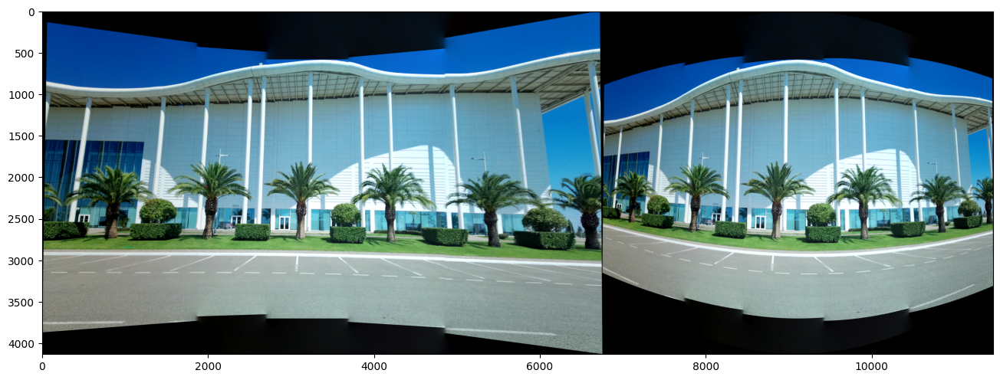

In [ ]:
plt.figure(figsize = (16,32))
plt.imshow(cv2.cvtColor(np.concatenate((pan3.im, pan1_mapped), axis = 1),cv2.COLOR_BGR2RGB))

Large Cylinder Radius

In [ ]:
map1 = get_cyl_transform(pan3.im.shape, 8000, FOV = 60)
pan1_mapped = cv2.remap(pan3.im, map1, None, interpolation =  cv2.INTER_CUBIC)

Estimation for focal length: 10548.668580690033
Cylinder radius: 18548.668580690035


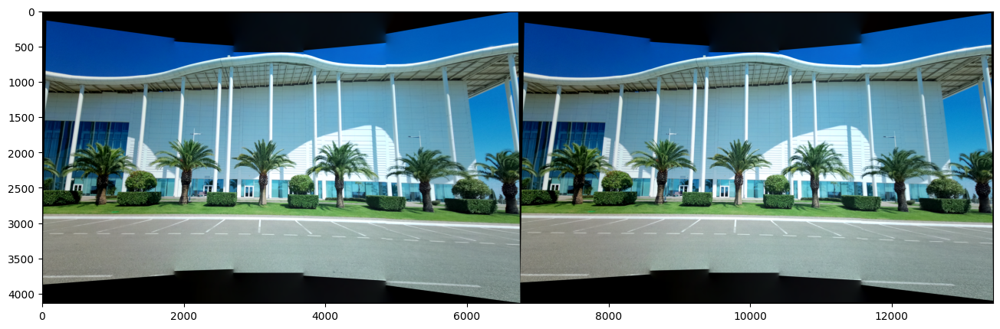

In [ ]:
plt.figure(figsize = (16,32))
plt.imshow(cv2.cvtColor(np.concatenate((pan3.im, pan1_mapped), axis = 1),cv2.COLOR_BGR2RGB))